<a href="https://colab.research.google.com/github/blakerobinson1/nba-2024/blob/main/ppg_eff_plot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install nba_api
!pip install matplotlib

In [11]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import requests
import os
from nba_api.stats.endpoints import LeagueLeaders
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
import matplotlib.offsetbox as offsetbox

from PIL import Image
import requests
from io import BytesIO

In [4]:
league_leaders = LeagueLeaders(
    league_id = '00', # nba 00, g_league 20, wnba 10
    season = '2024-25', # change year(s) if needed
    per_mode48 = 'PerGame', # "Totals", "Per48", "PerGame"
    )
df_league_leaders = league_leaders.get_data_frames()[0]

This section creates a new dataframe with player photo URLs attached to the players' names and IDs, to be used in the plot.

In [5]:
url = 'https://ak-static.cms.nba.com/wp-content/uploads/headshots/nba/latest/260x190/{PLAYER_ID}.png'

df_league_leaders_charted = df_league_leaders[['PLAYER', 'PLAYER_ID', 'PTS', 'EFF']]
df_league_leaders_charted['PLAYER_PHOTO'] = df_league_leaders_charted['PLAYER_ID'].apply(lambda x: url.format(PLAYER_ID=x))  # Populate the URL column


<ipython-input-5-ba398741081a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_league_leaders_charted['PLAYER_PHOTO'] = df_league_leaders_charted['PLAYER_ID'].apply(lambda x: url.format(PLAYER_ID=x))  # Populate the URL column


Captures all players scoring over 20 points per game

In [59]:
#df_top_players = df_league_leaders_charted.sort_values(by='PTS', ascending=False).head(38)
df_top_players = df_league_leaders_charted.loc[df_league_leaders_charted['PTS'] >= 20.0]
df_top_players.head(38)

,PLAYER,PLAYER_ID,PTS,EFF,PLAYER_PHOTO
0,Giannis Antetokounmpo,203507,31.6,35.3,https://ak-static.cms.nba.com/wp-content/uploa...
1,Anthony Davis,203076,31.2,35.3,https://ak-static.cms.nba.com/wp-content/uploa...
2,Jayson Tatum,1628369,30.5,29.6,https://ak-static.cms.nba.com/wp-content/uploa...
3,Nikola Jokić,203999,29.7,44.2,https://ak-static.cms.nba.com/wp-content/uploa...
4,LaMelo Ball,1630163,29.4,24.0,https://ak-static.cms.nba.com/wp-content/uploa...
5,Anthony Edwards,1630162,28.3,23.2,https://ak-static.cms.nba.com/wp-content/uploa...
6,Luka Dončić,1629029,28.3,27.8,https://ak-static.cms.nba.com/wp-content/uploa...
7,Shai Gilgeous-Alexander,1628983,27.8,29.5,https://ak-static.cms.nba.com/wp-content/uploa...
8,Tyrese Maxey,1630178,27.6,19.3,https://ak-static.cms.nba.com/wp-content/uploa...
9,Kevin Durant,201142,27.6,27.4,https://ak-static.cms.nba.com/wp-content/uploa...


Ran into RAM issues with Colab, so I added this section to download and save the images locally to make loading easier on memory. Not the easist/best way to do this but just needed to get those images local.

In [7]:
# Directory to store images
IMAGE_DIR = '/sample_data/Player_photos/'
os.makedirs(IMAGE_DIR, exist_ok=True)  # Creates the image directory

def save_image_locally(player_id, url):
    """
    Download and save the image locally with the player_id as the filename.
    """
    filename = f"{player_id}.png"  # Save image using player ID as the filename
    save_path = os.path.join(IMAGE_DIR, filename)

    # Only download if the image doesn't exist already
    if not os.path.exists(save_path):
        print(f"Downloading image for player {player_id}...")
        response = requests.get(url.format(PLAYER_ID=player_id))

        if response.status_code == 200:
            with open(save_path, 'wb') as file:
                file.write(response.content)
            print(f"Image for player {player_id} saved to {save_path}")
        else:
            print(f"Failed to download image for player {player_id}, status code: {response.status_code}")
    else:
        print(f"Image for player {player_id} already exists, skipping download.")

    return save_path

def getImage(player_id, url):
    """
    Retrieve the image for a player, downloading it if necessary.
    """
    # Get the local image path (will download if not already present)
    local_path = save_image_locally(player_id, url)

    # Open the image from the local path
    img = Image.open(local_path)
    return OffsetImage(img, zoom=0.1)

paths = df_top_players['PLAYER_PHOTO']
player_ids = df_top_players['PLAYER_ID']



# Loop through each player and add their image as an annotation
for player_id, path in zip(player_ids, paths):
    getImage(player_id, path)



Image for player 203507 already exists, skipping download.
Image for player 203076 already exists, skipping download.
Image for player 1628369 already exists, skipping download.
Image for player 203999 already exists, skipping download.
Image for player 1630163 already exists, skipping download.
Image for player 1630162 already exists, skipping download.
Image for player 1629029 already exists, skipping download.
Image for player 1628983 already exists, skipping download.
Image for player 1630178 already exists, skipping download.
Image for player 201142 already exists, skipping download.
Image for player 203081 already exists, skipping download.
Image for player 1626181 already exists, skipping download.
Image for player 202681 already exists, skipping download.
Image for player 1628973 already exists, skipping download.
Image for player 1626157 already exists, skipping download.
Image for player 201942 already exists, skipping download.
Image for player 1630560 already exists, skippi

Now that the files are on local, I need to re-write the image path for each player, since I didn't do that when I saved them locally.

In [20]:
url = '/sample_data/Player_photos/{PLAYER_ID}.png'

df_top_players['PLAYER_PHOTO'] = df_top_players['PLAYER_ID'].apply(lambda x: url.format(PLAYER_ID=x))  # Populate the URL column
df_top_players.head(40)


,PLAYER,PLAYER_ID,PTS,EFF,PLAYER_PHOTO
0,Giannis Antetokounmpo,203507,31.6,35.3,/sample_data/Player_photos/203507.png
1,Anthony Davis,203076,31.2,35.3,/sample_data/Player_photos/203076.png
2,Jayson Tatum,1628369,30.5,29.6,/sample_data/Player_photos/1628369.png
3,Nikola Jokić,203999,29.7,44.2,/sample_data/Player_photos/203999.png
4,LaMelo Ball,1630163,29.4,24.0,/sample_data/Player_photos/1630163.png
5,Anthony Edwards,1630162,28.3,23.2,/sample_data/Player_photos/1630162.png
6,Luka Dončić,1629029,28.3,27.8,/sample_data/Player_photos/1629029.png
7,Shai Gilgeous-Alexander,1628983,27.8,29.5,/sample_data/Player_photos/1628983.png
8,Tyrese Maxey,1630178,27.6,19.3,/sample_data/Player_photos/1630178.png
9,Kevin Durant,201142,27.6,27.4,/sample_data/Player_photos/201142.png


Lastly, making the plot

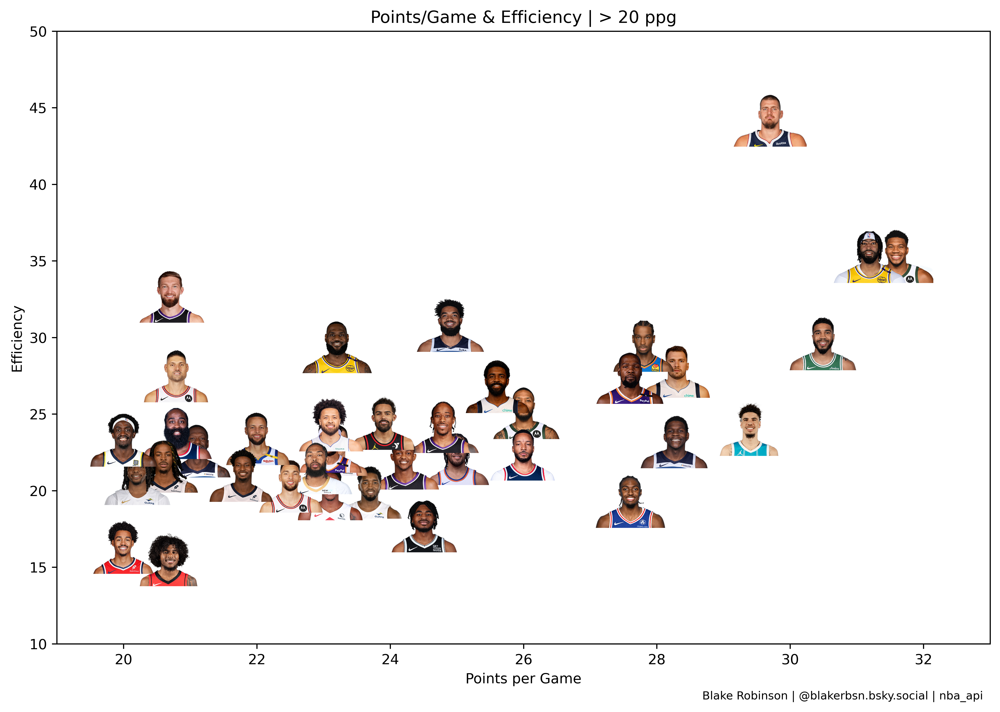

In [57]:
plt.rcParams["figure.figsize"] = [10, 7]
plt.rcParams['figure.autolayout'] = True

plt.rcParams['figure.dpi'] = 450  # You can try 200 or higher if necessary

x = df_top_players['PTS']
y = df_top_players['EFF']
paths = df_top_players['PLAYER_PHOTO']
player_ids = df_top_players['PLAYER_ID']


# Create the plot
fig, ax = plt.subplots()

plt.xlim(19, 33)
plt.ylim(10, 50)
plt.title("Points/Game & Efficiency | > 20 ppg")
plt.xlabel("Points per Game")
plt.ylabel("Efficiency")
plt.figtext(.7, -.001, 'Blake Robinson | @blakerbsn.bsky.social | nba_api', ha='left', va='bottom', fontsize=8)

ax.scatter(x, y, color='blue')

def getImage(path):
  return OffsetImage(plt.imread(path), zoom = 0.2)

# Overlay the images
for x0, y0, path in zip(x, y, paths):
  ab = AnnotationBbox(getImage(path), (x0, y0), frameon = False)
  ax.add_artist(ab)


plt.show()
